# SYNTHENTIC DATA PROJECT

FILENAME: synthetic_data.ipynb
    
PROJECT: Randomized Data Model

DATE CREATED: 27-MAY-20

DATE UPDATED: 14-AUG-20

The purpose of this notebook is to create and replicate the core funtionalities of the on site budgeted and execution based tables.  The end product are two distinct dataframes, 'budget_table' & 'execution_table' and is capable of upload into either the Postgresql environment for storage, or directly into 3rd party visualization tools such as Tableau and Power BI for follow-on visualization activities.

## PHASE 1: PROJECT SETUP

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [2]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
from itertools import repeat
import time as t
import getpass as gp

# plotting modules
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go

import networkx as nx

Create a function which creates a dataframe with a length 'df_length' and randomizes the distribution of values as each year progresses

- Column names include: 'projects', 'subprojects', 'programs', 'rca'
- Budget years include:  'year 3 forecast', 'year 2 forecast', 'year 1 forecast', 'planned value', 'appropriation value', 'obligated value'



In [3]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    
    length = df_length
    
    num_of_projects = 20 # can change the amount of projects
    num_of_subprojects = 40 # can change the amount of subprojects
    num_of_rca = 80 # can change the amount of RCAs
    num_of_programs = 120 # number of programs

    # create a sequential list of column values for projects, subprojects, and RCAs
    proj_list = ['project-' + str(i+1) for i in range(num_of_projects)] # create a list of project names
    subproject_list = ['subproject-' + str(i+1) for i in range(num_of_subprojects)] # create a list of subproject names
    rca_list = ['rca-' + str(i+1) for i in range(num_of_rca)] # create a list of RCAs
    program_list = ['program-' + str(i+1) for i in range(num_of_programs)] # create a list of program names

    
    # create lists of each for each of the ordinal column values
    project_values = []
    subproject_values = []
    rca_values = []
    program_values = []

    
    for index in range(length):
        
        # select a random value from each list
        proj_val = random.choice(proj_list)
        sb_val = (random.choice(subproject_list))
        program_val = random.choice(program_list)
        rca_val = random.choice(rca_list)
        
        # append the randomized value to the default list
        project_values.append(proj_val)
        subproject_values.append(sb_val)
        program_values.append(program_val)
        rca_values.append(rca_val)
    
    # create randomized budget data, 6 x columns in total (3-2-1 forecast, plan, approp, oblig)
    yr3_forecast= np.random.randint(low = 1000, high = 30000, size = df_length) 
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    # create the empty dataframe with the required columns
    raw_df = pd.DataFrame(columns=['project', 'subproject', 'program_title', 'rca','yr3_forecast','yr2_forecast','yr1_forecast','yr0_plan','yr1_approp','yr2_oblig'])

    # assign the list values to the columns in the master dataframe
    raw_df['project'] = project_values
    raw_df['subproject'] = subproject_values
    raw_df['rca'] = rca_values
    raw_df['program_title'] = program_values

    raw_df['yr3_forecast'] = yr3_forecast
    raw_df['yr2_forecast'] = yr2_forecast
    raw_df['yr1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr1_approp'] = approp_val
    raw_df['yr2_oblig'] = oblig_val
    
    return raw_df # return the dataframe object

Sankey visualization function - used to plot data located in the passed dataframe argument

In [4]:
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = ['#4B8BBE','#306998','#FFE873','#FFD43B','#646464']
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count']
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 10
        )
    )
       
    fig = dict(data=[data], layout=layout)
    return fig



# PHASE 2: FUNCTION TEST

Invoke the 'init_array' function in order to create a sample budgetary data set of 10,000 records

In [5]:
train_df = init_array(10000)
train_df.tail(10)

,project,subproject,program_title,rca,yr3_forecast,yr2_forecast,yr1_forecast,yr0_plan,yr1_approp,yr2_oblig
9990,project-13,subproject-19,program-89,rca-43,12590,9616.30,10904.97,13478.92,14222.33,13008.69
9991,project-12,subproject-13,program-17,rca-51,11111,11336.28,10488.61,12242.07,13966.74,13644.06
9992,project-5,subproject-9,program-47,rca-25,14997,14091.53,14088.55,13844.41,9474.38,8554.83
9993,project-10,subproject-36,program-7,rca-69,5354,6826.71,6096.32,5806.96,5076.41,4172.13
9994,project-14,subproject-23,program-53,rca-9,16151,19092.59,19914.44,16700.88,11823.97,11698.31
9995,project-3,subproject-1,program-88,rca-54,8426,8283.16,8272.07,10487.29,11142.39,8941.34
9996,project-8,subproject-23,program-36,rca-42,4431,3088.77,2945.03,2115.15,1504.91,1241.88
9997,project-16,subproject-12,program-67,rca-61,7661,8932.85,10059.72,10443.99,11318.35,9464.34
9998,project-1,subproject-29,program-118,rca-53,3852,3945.14,3566.09,2423.05,1661.37,1350.51
9999,project-15,subproject-15,program-32,rca-66,9289,10988.03,9249.69,11949.00,9313.24,8306.97


Create a unique key based on the concatenation of the 'project', 'subproject', 'program_title', 'rca' column values

In [6]:
train_df['key'] = train_df['project'] + '-' + train_df['subproject'] + '-' + train_df['program_title'] + '-' + train_df['rca']
train_df['key']


0         project-9-subproject-40-program-6-rca-28
1        project-18-subproject-11-program-87-rca-6
2          project-2-subproject-9-program-39-rca-5
3       project-19-subproject-27-program-65-rca-32
4        project-3-subproject-18-program-78-rca-10
                           ...                    
9995      project-3-subproject-1-program-88-rca-54
9996     project-8-subproject-23-program-36-rca-42
9997    project-16-subproject-12-program-67-rca-61
9998    project-1-subproject-29-program-118-rca-53
9999    project-15-subproject-15-program-32-rca-66
Name: key, Length: 10000, dtype: object

Remove duplicate rows as a way to mitigate collisions

In [7]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("Total count of duplicated rows :")
print(len(duplicateRowsDF))

Duplicate Rows except first occurrence based on all columns are :
                                             key
1852    project-3-subproject-2-program-22-rca-34
2574  project-20-subproject-26-program-68-rca-19
5498   project-4-subproject-27-program-99-rca-20
9850   project-12-subproject-13-program-23-rca-7
Total count of duplicated rows :
4


Dropping all duplicte 'key' values 

In [8]:
train_df.drop_duplicates(subset ="key", 
                     keep = False, inplace = True) 


In [9]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("\nTotal count of duplicated rows :",len(duplicateRowsDF))


Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [key]
Index: []

Total count of duplicated rows : 0


### Store unique 'key' values in data structures

Create a list of all column names for future iteration activities

In [10]:
budget_col_names = list(train_df.columns)
budget_col_names

['project',
 'subproject',
 'program_title',
 'rca',
 'yr3_forecast',
 'yr2_forecast',
 'yr1_forecast',
 'yr0_plan',
 'yr1_approp',
 'yr2_oblig',
 'key']

In [11]:
budget_ordinal_names = budget_col_names[:4]
budget_ordinal_names

['project', 'subproject', 'program_title', 'rca']

In [12]:
budget_quant_names = budget_col_names[4:10]
budget_quant_names

['yr3_forecast',
 'yr2_forecast',
 'yr1_forecast',
 'yr0_plan',
 'yr1_approp',
 'yr2_oblig']

Create a list of unique project values

In [13]:
proj_uniq_values = train_df['project'].unique()
print(set(proj_uniq_values))

{'project-7', 'project-13', 'project-19', 'project-15', 'project-8', 'project-17', 'project-10', 'project-20', 'project-12', 'project-4', 'project-5', 'project-18', 'project-9', 'project-2', 'project-1', 'project-11', 'project-14', 'project-3', 'project-6', 'project-16'}


Create a list of subproject values

In [14]:
subproj_uniq_values = train_df['subproject'].unique()
print(set(subproj_uniq_values))

{'subproject-23', 'subproject-10', 'subproject-39', 'subproject-24', 'subproject-12', 'subproject-33', 'subproject-36', 'subproject-34', 'subproject-15', 'subproject-4', 'subproject-38', 'subproject-20', 'subproject-14', 'subproject-22', 'subproject-27', 'subproject-16', 'subproject-25', 'subproject-31', 'subproject-19', 'subproject-30', 'subproject-3', 'subproject-32', 'subproject-21', 'subproject-1', 'subproject-2', 'subproject-9', 'subproject-29', 'subproject-18', 'subproject-13', 'subproject-17', 'subproject-11', 'subproject-5', 'subproject-35', 'subproject-7', 'subproject-37', 'subproject-40', 'subproject-26', 'subproject-8', 'subproject-28', 'subproject-6'}


Create a list of unique RCA values

In [15]:
rca_uniq_values = train_df['rca'].unique()
print(set(rca_uniq_values))

{'rca-13', 'rca-14', 'rca-48', 'rca-72', 'rca-11', 'rca-58', 'rca-4', 'rca-33', 'rca-8', 'rca-43', 'rca-62', 'rca-19', 'rca-42', 'rca-76', 'rca-28', 'rca-7', 'rca-67', 'rca-1', 'rca-29', 'rca-61', 'rca-34', 'rca-24', 'rca-80', 'rca-78', 'rca-25', 'rca-69', 'rca-53', 'rca-77', 'rca-60', 'rca-31', 'rca-56', 'rca-3', 'rca-73', 'rca-22', 'rca-38', 'rca-55', 'rca-9', 'rca-59', 'rca-66', 'rca-16', 'rca-65', 'rca-32', 'rca-35', 'rca-74', 'rca-44', 'rca-52', 'rca-64', 'rca-57', 'rca-12', 'rca-45', 'rca-26', 'rca-30', 'rca-18', 'rca-2', 'rca-10', 'rca-37', 'rca-6', 'rca-50', 'rca-15', 'rca-79', 'rca-20', 'rca-54', 'rca-46', 'rca-27', 'rca-68', 'rca-17', 'rca-47', 'rca-21', 'rca-5', 'rca-49', 'rca-51', 'rca-41', 'rca-40', 'rca-63', 'rca-71', 'rca-23', 'rca-70', 'rca-39', 'rca-36', 'rca-75'}


Create a list of unique program title values

In [16]:
program_uniq_values = train_df['program_title'].unique()
print(set(program_uniq_values))

{'program-67', 'program-11', 'program-64', 'program-76', 'program-83', 'program-34', 'program-120', 'program-112', 'program-15', 'program-57', 'program-41', 'program-87', 'program-84', 'program-51', 'program-79', 'program-12', 'program-106', 'program-31', 'program-50', 'program-74', 'program-80', 'program-10', 'program-111', 'program-68', 'program-42', 'program-30', 'program-113', 'program-102', 'program-18', 'program-7', 'program-47', 'program-108', 'program-99', 'program-93', 'program-66', 'program-105', 'program-103', 'program-94', 'program-27', 'program-14', 'program-75', 'program-110', 'program-104', 'program-115', 'program-73', 'program-4', 'program-20', 'program-69', 'program-70', 'program-114', 'program-95', 'program-60', 'program-55', 'program-107', 'program-6', 'program-119', 'program-88', 'program-53', 'program-91', 'program-100', 'program-46', 'program-62', 'program-90', 'program-116', 'program-109', 'program-49', 'program-13', 'program-52', 'program-21', 'program-61', 'pro

### Visualize the generated data set

'Project' Title Visualization

In [17]:
for col_name in budget_col_names:
    
    raw_val = train_df[[col_name]]
    
    chart_title = col_name + ' Histogram'
    xaxis_title = col_name + ' Counts'
    yaxis_title = 'Frequency'
    
    # plot the histogram
    fig = px.histogram(raw_val, x=col_name,  # can be `box`, `violin`
                   nbins=12)
    fig.update_layout(
        title = chart_title,
        autosize=False,
        width=1500,
        height=700,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
            ),
        paper_bgcolor="white",
    )
    fig.show()

### Visualize Summarized Budget at the Project, Subproject, RCA, and Program levels

Group by and sum project, subproject, RCA, program level obligation values

In [18]:
for col_name in budget_ordinal_names:
    
        col_df = train_df[[col_name, 'yr2_oblig']]

        sum_df = col_df.groupby(col_name).sum().reset_index()
        sort_df = sum_df.sort_values(by='yr2_oblig', ascending=True)
        
        chart_title = col_name + ' Summary'

        xaxis_title = col_name 
        yaxis_title = 'Total by yr2_oblig'

        # plot the histogram
        fig = px.bar(sort_df, x='yr2_oblig', y=col_name, orientation='h', color='yr2_oblig',)

        fig.update_layout(
            title = chart_title,
            autosize=False,
            width=1500,
            height=700,
            margin=dict(
                l=50,
                r=50,
                b=100,
                t=100,
                pad=4
                ),
            paper_bgcolor="white",
        )
        fig.show()

### Network X Graph Visualization

Utilize the Network X graph in order to depict relationships across the budget hiearchy

#### Project to Subproject network graph

In [19]:
proj_list = train_df['project'].to_list()
subproj_list = train_df['subproject'].to_list()

graph_df = train_df[['project', 'subproject']]
graph_df

,project,subproject
0,project-9,subproject-40
1,project-18,subproject-11
2,project-2,subproject-9
3,project-19,subproject-27
4,project-3,subproject-18
...,...,...
9995,project-3,subproject-1
9996,project-8,subproject-23
9997,project-16,subproject-12
9998,project-1,subproject-29


Create the networkx object and plot

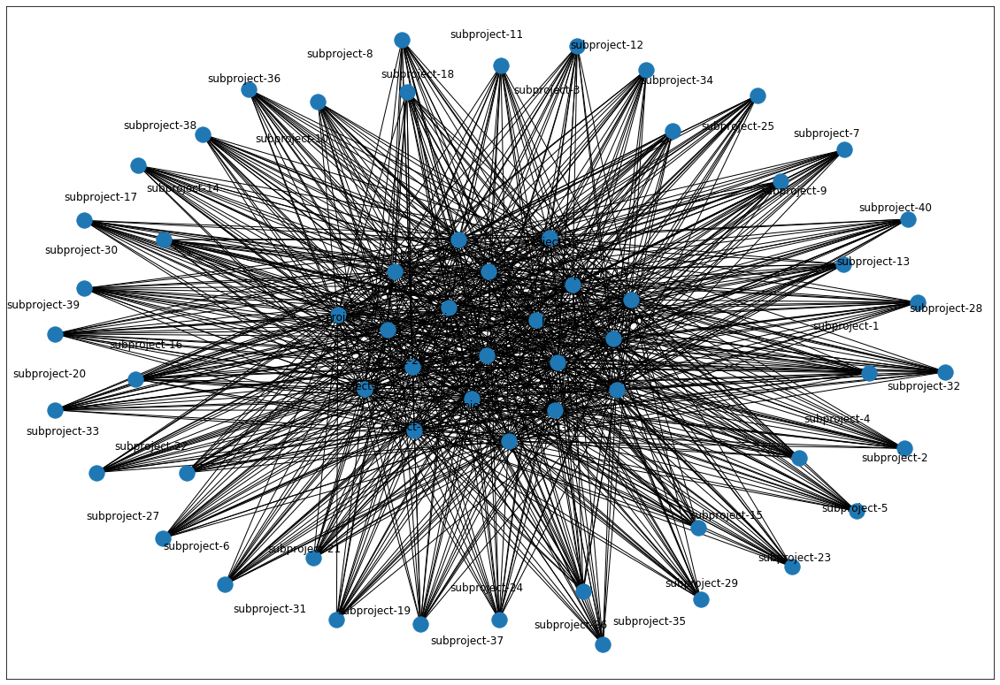

In [20]:
G=nx.from_pandas_edgelist(graph_df, 'project', 'subproject')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

Generate Sankey visualization

In [21]:
sum_df = train_df.groupby(['project', 'subproject', 'yr2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

#### Subproject to Program List network graph

In [22]:
subproj_list = train_df['subproject'].to_list()
prog_list = train_df['program_title'].to_list()

graph_df_2 = train_df[['subproject', 'program_title']]
graph_df_2

,subproject,program_title
0,subproject-40,program-6
1,subproject-11,program-87
2,subproject-9,program-39
3,subproject-27,program-65
4,subproject-18,program-78
...,...,...
9995,subproject-1,program-88
9996,subproject-23,program-36
9997,subproject-12,program-67
9998,subproject-29,program-118


Create the networkx object and plot

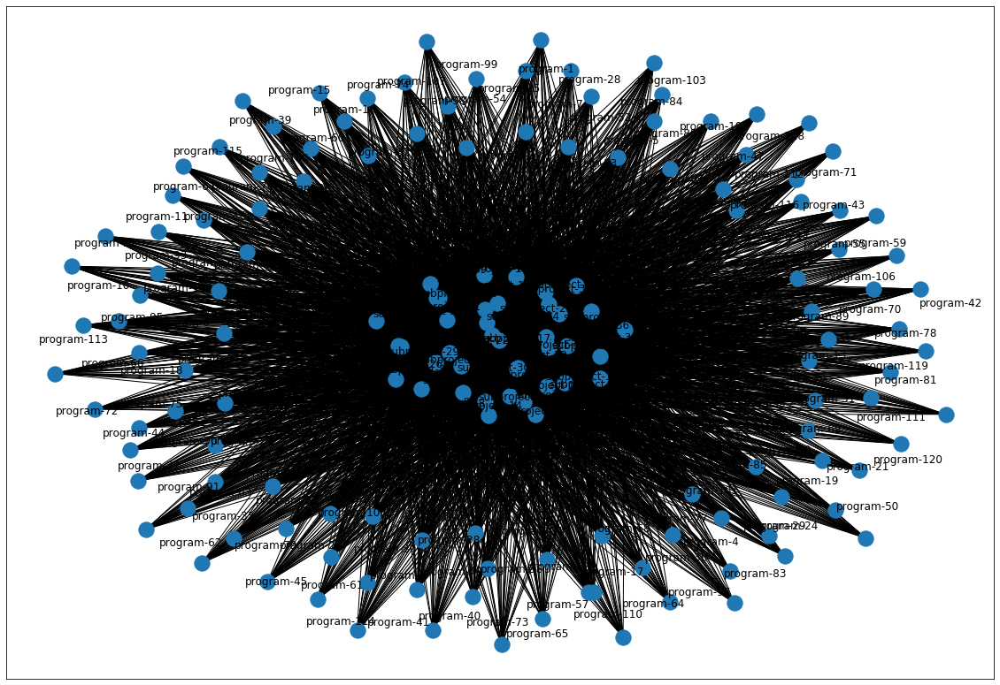

In [23]:
G=nx.from_pandas_edgelist(graph_df_2, 'subproject', 'program_title')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

### Generate the sankey analysis 

Only retrieve the first 500 records

In [24]:
train_200 = train_df[:200].copy()

In [25]:
sum_df = train_200.groupby(['project', 'subproject', 'yr2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

In [26]:
train_df.head(10)

,project,subproject,program_title,rca,yr3_forecast,yr2_forecast,yr1_forecast,yr0_plan,yr1_approp,yr2_oblig,key
0,project-9,subproject-40,program-6,rca-28,16771,10505.27,11871.16,15175.89,10041.74,9320.76,project-9-subproject-40-program-6-rca-28
1,project-18,subproject-11,program-87,rca-6,6686,4240.31,4421.41,5249.76,6066.77,4895.15,project-18-subproject-11-program-87-rca-6
2,project-2,subproject-9,program-39,rca-5,5983,3564.61,4228.41,3522.07,3028.91,2633.15,project-2-subproject-9-program-39-rca-5
3,project-19,subproject-27,program-65,rca-32,16451,16059.41,13583.78,12045.64,10625.33,9832.75,project-19-subproject-27-program-65-rca-32
4,project-3,subproject-18,program-78,rca-10,16265,8962.94,9021.74,11722.56,8580.30,8203.66,project-3-subproject-18-program-78-rca-10
5,project-15,subproject-15,program-12,rca-78,17695,14957.88,12951.24,8138.31,5856.87,5193.33,project-15-subproject-15-program-12-rca-78
6,project-3,subproject-19,program-21,rca-48,27895,14265.51,16429.13,13919.45,8637.35,8550.02,project-3-subproject-19-program-21-rca-48
7,project-11,subproject-34,program-101,rca-19,8388,8672.07,7097.19,5929.28,5850.56,5553.85,project-11-subproject-34-program-101-rca-19
8,project-20,subproject-23,program-116,rca-21,16649,16505.66,18904.24,13545.89,14370.86,14193.08,project-20-subproject-23-program-116-rca-21
9,project-14,subproject-9,program-18,rca-48,14488,13774.46,15330.87,15133.96,10486.23,9171.77,project-14-subproject-9-program-18-rca-48


# PHASE 3: RANDOMIZE EXECUTION DATA 

Section to build out the test data and functions

Create a shallow copy of the completed 'train_df' dataframe in order to conducted stand alone financial execution data analysis

In [27]:
exe_df = train_df.copy()
exe_df.head(5)

,project,subproject,program_title,rca,yr3_forecast,yr2_forecast,yr1_forecast,yr0_plan,yr1_approp,yr2_oblig,key
0,project-9,subproject-40,program-6,rca-28,16771,10505.27,11871.16,15175.89,10041.74,9320.76,project-9-subproject-40-program-6-rca-28
1,project-18,subproject-11,program-87,rca-6,6686,4240.31,4421.41,5249.76,6066.77,4895.15,project-18-subproject-11-program-87-rca-6
2,project-2,subproject-9,program-39,rca-5,5983,3564.61,4228.41,3522.07,3028.91,2633.15,project-2-subproject-9-program-39-rca-5
3,project-19,subproject-27,program-65,rca-32,16451,16059.41,13583.78,12045.64,10625.33,9832.75,project-19-subproject-27-program-65-rca-32
4,project-3,subproject-18,program-78,rca-10,16265,8962.94,9021.74,11722.56,8580.30,8203.66,project-3-subproject-18-program-78-rca-10


Extract only the needed categorical columns

In [28]:
exe_slice = exe_df[['key','project','subproject','program_title','rca','yr0_plan']]
exe_slice = exe_slice.rename(columns={'yr0_plan': "usd_value"})
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89
1,project-18-subproject-11-program-87-rca-6,project-18,subproject-11,program-87,rca-6,5249.76
2,project-2-subproject-9-program-39-rca-5,project-2,subproject-9,program-39,rca-5,3522.07
3,project-19-subproject-27-program-65-rca-32,project-19,subproject-27,program-65,rca-32,12045.64
4,project-3-subproject-18-program-78-rca-10,project-3,subproject-18,program-78,rca-10,11722.56


Assign year ending values to the dataframe

In [29]:
exe_slice['month'] = '12'
exe_slice['year'] = '2019'
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value,month,year
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019
1,project-18-subproject-11-program-87-rca-6,project-18,subproject-11,program-87,rca-6,5249.76,12,2019
2,project-2-subproject-9-program-39-rca-5,project-2,subproject-9,program-39,rca-5,3522.07,12,2019
3,project-19-subproject-27-program-65-rca-32,project-19,subproject-27,program-65,rca-32,12045.64,12,2019
4,project-3-subproject-18-program-78-rca-10,project-3,subproject-18,program-78,rca-10,11722.56,12,2019


Create a list of randomized obligated values for month ending 9-30-2019

In [30]:
df_len = len(exe_slice)
eoy_oblig = [random.uniform(0.9, 1.0) for x in range(df_len)]
eoy_oblig

[0.9033273995947017,
 0.9264315041413463,
 0.9631079930891141,
 0.9388017399780965,
 0.9713381855197726,
 0.9634090809010688,
 0.9737206450112139,
 0.9806083559255749,
 0.9673033996094448,
 0.9396083024562334,
 0.9846487713319851,
 0.9599852622513834,
 0.9314529489733283,
 0.9819167946627103,
 0.9788916981459153,
 0.9529993302236931,
 0.9183466783491037,
 0.9282249315280303,
 0.9066479819525266,
 0.9172522872565991,
 0.936918685248985,
 0.9174058900320559,
 0.9345699463673297,
 0.9288950134028828,
 0.912711959674881,
 0.9003267807547163,
 0.9702490183002266,
 0.9115401334564179,
 0.96389678177863,
 0.9757751181346476,
 0.9418956744817989,
 0.9966902883616198,
 0.9804405821064319,
 0.9312880273634588,
 0.9040337284963695,
 0.9105421336081634,
 0.9841140697385201,
 0.967592436508893,
 0.9729701086454917,
 0.9747006137388841,
 0.9909155281461581,
 0.9110594812180366,
 0.997842706092998,
 0.9385477945711322,
 0.9721559914209147,
 0.9297657904458372,
 0.9407058456668442,
 0.9590837864939044

Calculate the end of year obligation values

In [31]:
exe_slice['oblig'] = exe_slice['usd_value'] * eoy_oblig
exe_slice

,key,project,subproject,program_title,rca,usd_value,month,year,oblig
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250
1,project-18-subproject-11-program-87-rca-6,project-18,subproject-11,program-87,rca-6,5249.76,12,2019,4863.543053
2,project-2-subproject-9-program-39-rca-5,project-2,subproject-9,program-39,rca-5,3522.07,12,2019,3392.133769
3,project-19-subproject-27-program-65-rca-32,project-19,subproject-27,program-65,rca-32,12045.64,12,2019,11308.467791
4,project-3-subproject-18-program-78-rca-10,project-3,subproject-18,program-78,rca-10,11722.56,12,2019,11386.570160
...,...,...,...,...,...,...,...,...,...
9995,project-3-subproject-1-program-88-rca-54,project-3,subproject-1,program-88,rca-54,10487.29,12,2019,10046.440449
9996,project-8-subproject-23-program-36-rca-42,project-8,subproject-23,program-36,rca-42,2115.15,12,2019,1958.734232
9997,project-16-subproject-12-program-67-rca-61,project-16,subproject-12,program-67,rca-61,10443.99,12,2019,9947.053027
9998,project-1-subproject-29-program-118-rca-53,project-1,subproject-29,program-118,rca-53,2423.05,12,2019,2247.686956


Create the execution burn rate percentages

In [32]:
eoy_exe = [random.uniform(0.6, .9) for x in range(df_len)]
eoy_exe

[0.8015477986672784,
 0.7915077718979724,
 0.6310269128387981,
 0.7569519132053134,
 0.7934196366373263,
 0.6689442019924263,
 0.6512123656086152,
 0.7274943240272533,
 0.8076399662063848,
 0.869922078419727,
 0.7986759087346891,
 0.8072651964278327,
 0.6272165122577454,
 0.8964976479552573,
 0.6288301588993955,
 0.8322753577367339,
 0.7570641486736087,
 0.7708567637849636,
 0.8109996703058016,
 0.8607174728732705,
 0.6389691682873427,
 0.6920625085163055,
 0.7471223252413088,
 0.7326014847875355,
 0.7853886622488615,
 0.636314875610018,
 0.6015581843778488,
 0.7256961243295519,
 0.8303545048129619,
 0.6980781161883999,
 0.7193527265425926,
 0.6671946315479829,
 0.8990979752087389,
 0.8099970107699326,
 0.8686808440830103,
 0.854921928018515,
 0.8620922968685366,
 0.8229925539290115,
 0.6562704921394581,
 0.6839163484416031,
 0.6096341449214381,
 0.6176614452412014,
 0.7078390787100785,
 0.8600470656144452,
 0.6573889449375708,
 0.7824216390800691,
 0.7057154465585102,
 0.8730237278917

Calculate the obligation and execution rates at the month level

In [33]:
exe_slice['total_authority'] = exe_slice['oblig']
exe_slice['executed'] = exe_slice['oblig'] * eoy_exe
exe_slice[:10]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.797250,10988.256258
1,project-18-subproject-11-program-87-rca-6,project-18,subproject-11,program-87,rca-6,5249.76,12,2019,4863.543053,4863.543053,3849.532126
2,project-2-subproject-9-program-39-rca-5,project-2,subproject-9,program-39,rca-5,3522.07,12,2019,3392.133769,3392.133769,2140.527700
3,project-19-subproject-27-program-65-rca-32,project-19,subproject-27,program-65,rca-32,12045.64,12,2019,11308.467791,11308.467791,8559.966330
4,project-3-subproject-18-program-78-rca-10,project-3,subproject-18,program-78,rca-10,11722.56,12,2019,11386.570160,11386.570160,9034.328359
5,project-15-subproject-15-program-12-rca-78,project-15,subproject-15,program-12,rca-78,8138.31,12,2019,7840.521757,7840.521757,5244.871570
6,project-3-subproject-19-program-21-rca-48,project-3,subproject-19,program-21,rca-48,13919.45,12,2019,13553.655832,13553.655832,8826.308277
7,project-11-subproject-34-program-101-rca-19,project-11,subproject-34,program-101,rca-19,5929.28,12,2019,5814.301513,5814.301513,4229.871349
8,project-20-subproject-23-program-116-rca-21,project-20,subproject-23,program-116,rca-21,13545.89,12,2019,13102.985448,13102.985448,10582.494724
9,project-14-subproject-9-program-18-rca-48,project-14,subproject-9,program-18,rca-48,15133.96,12,2019,14219.994465,14219.994465,12370.287140


Create a list of 'key' values

In [34]:
key_list = list(exe_slice['key'])
key_list

['project-9-subproject-40-program-6-rca-28',
 'project-18-subproject-11-program-87-rca-6',
 'project-2-subproject-9-program-39-rca-5',
 'project-19-subproject-27-program-65-rca-32',
 'project-3-subproject-18-program-78-rca-10',
 'project-15-subproject-15-program-12-rca-78',
 'project-3-subproject-19-program-21-rca-48',
 'project-11-subproject-34-program-101-rca-19',
 'project-20-subproject-23-program-116-rca-21',
 'project-14-subproject-9-program-18-rca-48',
 'project-6-subproject-36-program-7-rca-37',
 'project-8-subproject-33-program-89-rca-66',
 'project-14-subproject-28-program-92-rca-72',
 'project-9-subproject-5-program-116-rca-39',
 'project-4-subproject-37-program-82-rca-75',
 'project-7-subproject-38-program-57-rca-80',
 'project-9-subproject-22-program-74-rca-57',
 'project-5-subproject-35-program-90-rca-39',
 'project-7-subproject-26-program-104-rca-10',
 'project-5-subproject-28-program-71-rca-14',
 'project-1-subproject-36-program-84-rca-38',
 'project-12-subproject-5-prog

In [35]:
exe_slice.dtypes

key                 object
project             object
subproject          object
program_title       object
rca                 object
usd_value          float64
month               object
year                object
oblig              float64
total_authority    float64
executed           float64
dtype: object

## Test one key for the timeseries for loop

Extract the first value from the master dataframe

In [36]:
temp = exe_slice[:1]
temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.79725,13708.79725,10988.256258


Generate a dataframe with the newly added columns:
    
    1. executed - column to store executed EOM transactions
    2. total_authority - column to store total authority values for a given key (i.e. 'project-17-subproject-25-rca-43-program-28')

In [37]:
for month in range(11): # iterate through the remaining 11 months of the calendar year
    
    print("top of the loop")
    display(temp)
    current_month = 11 - month
    print("Current month: ", current_month)
    
    forward_month = int(current_month) + 1
    print("Forward month: ", forward_month)
    
    converted_month = str(forward_month)
    print("Converted month: ", converted_month)
    
    month_cond = temp['month'].str.startswith(converted_month, na=False) 

    temp_row = temp[month_cond]
    display(temp_row)
    #display(temp_row.iat[0,0])

    key_val = temp.iat[month,0]
    print(key_val)
    
    # assign the project value
    project_val = temp.iat[month,1]
    print(project_val)
    
    # assign the subproject value
    subproject_val = temp.iat[month,2]
    print(subproject_val)
    
    # assign the program value
    program_val = temp.iat[month,3]
    print(program_val)
    
    # assign the rca value
    rca_val = temp.iat[month,4]
    print(rca_val)
    
    # assign the forward month obligation value
    forward_oblig_val = temp.iat[month,8]
    print(forward_oblig_val)

    # assign the current month obligation value
    current_oblig_val = forward_oblig_val * .8
    print(current_oblig_val)
    
    # assign the forward month execution value
    forward_exe_val = temp.iat[month,10]
    print(forward_exe_val)

    # assign the current month execution value
    current_exe_val = forward_oblig_val * .7
    print(current_exe_val)
    
    ta_val = temp.iat[month,9]
    print(ta_val)

    usd_val = 0
    temp = temp.append(pd.DataFrame([[key_val,project_val,subproject_val,rca_val,program_val, usd_val, current_month, '2019', current_oblig_val,ta_val, current_exe_val]], columns=temp.columns))
    print('\nAdded row\n')

    

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.79725,13708.79725,10988.256258


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.79725,13708.79725,10988.256258


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
program-6
rca-28
13708.797250235237
10967.03780018819
10988.256258302094
9596.158075164665
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.79725,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.03780,13708.79725,9596.158075


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
rca-28
program-6
10967.03780018819
8773.630240150553
9596.158075164665
7676.926460131733
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.79725,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.03780,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.63024,13708.79725,7676.926460


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
program-6
rca-28
8773.630240150553
7018.9041921204425
7676.926460131733
6141.5411681053865
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
rca-28
program-6
7018.9041921204425
5615.123353696355
6141.5411681053865
4913.232934484309
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
program-6
rca-28
5615.123353696355
4492.098682957084
4913.232934484309
3930.586347587448
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,7,2019,4492.098683,13708.79725,3930.586348


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
rca-28
program-6
4492.098682957084
3593.6789463656673
3930.586347587448
3144.4690780699584
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,7,2019,4492.098683,13708.79725,3930.586348
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,6,2019,3593.678946,13708.79725,3144.469078


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
program-6
rca-28
3593.6789463656673
2874.943157092534
3144.4690780699584
2515.575262455967
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,7,2019,4492.098683,13708.79725,3930.586348
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,6,2019,3593.678946,13708.79725,3144.469078
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,5,2019,2874.943157,13708.79725,2515.575262


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
rca-28
program-6
2874.943157092534
2299.954525674027
2515.575262455967
2012.4602099647736
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,7,2019,4492.098683,13708.79725,3930.586348
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,6,2019,3593.678946,13708.79725,3144.469078
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,5,2019,2874.943157,13708.79725,2515.575262
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,4,2019,2299.954526,13708.79725,2012.460210


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
program-6
rca-28
2299.954525674027
1839.9636205392217
2012.4602099647736
1609.968167971819
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,7,2019,4492.098683,13708.79725,3930.586348
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,6,2019,3593.678946,13708.79725,3144.469078
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,5,2019,2874.943157,13708.79725,2515.575262
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,4,2019,2299.954526,13708.79725,2012.460210
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,3,2019,1839.963621,13708.79725,1609.968168


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
rca-28
program-6
1839.9636205392217
1471.9708964313775
1609.968167971819
1287.974534377455
13708.797250235237

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,7,2019,4492.098683,13708.79725,3930.586348
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,6,2019,3593.678946,13708.79725,3144.469078
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,5,2019,2874.943157,13708.79725,2515.575262
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,4,2019,2299.954526,13708.79725,2012.460210
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,3,2019,1839.963621,13708.79725,1609.968168


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-9-subproject-40-program-6-rca-28
project-9
subproject-40
program-6
rca-28
1471.9708964313775
1177.576717145102
1287.974534377455
1030.3796275019643
13708.797250235237

Added row



Calculate utilization percentages

In [38]:
temp['oblig_ta_rate'] = temp['oblig'] / temp['total_authority']
temp['exe_ta_rate'] = temp['executed'] / temp['total_authority']
temp['exe_oblig_rate'] = temp['executed'] / temp['oblig']

temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed,oblig_ta_rate,exe_ta_rate,exe_oblig_rate
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.79725,10988.256258,1.000000,0.801548,0.801548
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,11,2019,10967.037800,13708.79725,9596.158075,0.800000,0.700000,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,10,2019,8773.630240,13708.79725,7676.926460,0.640000,0.560000,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,9,2019,7018.904192,13708.79725,6141.541168,0.512000,0.448000,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,8,2019,5615.123354,13708.79725,4913.232934,0.409600,0.358400,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,7,2019,4492.098683,13708.79725,3930.586348,0.327680,0.286720,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,6,2019,3593.678946,13708.79725,3144.469078,0.262144,0.229376,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,5,2019,2874.943157,13708.79725,2515.575262,0.209715,0.183501,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,0.00,4,2019,2299.954526,13708.79725,2012.460210,0.167772,0.146801,0.875000
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,rca-28,program-6,0.00,3,2019,1839.963621,13708.79725,1609.968168,0.134218,0.117441,0.875000


Melt the quant columns to two columns, 'variable' and 'value'

In [39]:
plot_temp = temp[['month', 'oblig', 'total_authority', 'executed']].reset_index()
df_waterfall = pd.melt(plot_temp, id_vars=["month"], value_vars=["oblig", "total_authority", 'executed'])
df_waterfall[:10]

,month,variable,value
0,12,oblig,13708.797250
1,11,oblig,10967.037800
2,10,oblig,8773.630240
3,9,oblig,7018.904192
4,8,oblig,5615.123354
5,7,oblig,4492.098683
6,6,oblig,3593.678946
7,5,oblig,2874.943157
8,4,oblig,2299.954526
9,3,oblig,1839.963621


Sort the values by month and variable, descending

In [40]:
sorted_df = df_waterfall.sort_values(by=['month', 'variable'])
sorted_df[:10]

,month,variable,value
35,1,executed,1030.379628
11,1,oblig,1177.576717
23,1,total_authority,13708.797250
34,2,executed,1287.974534
10,2,oblig,1471.970896
22,2,total_authority,13708.797250
33,3,executed,1609.968168
9,3,oblig,1839.963621
21,3,total_authority,13708.797250
32,4,executed,2012.460210


Create the plotly chart

In [41]:

fig = px.bar(sorted_df, y='value', x='month', color = 'variable', title = "Execution, Obligation, and Total Authority Summary")
fig.update_layout(barmode='group')
fig.show()

### Visualize the utilization percentages at the RCA level

In [42]:
plot_temp = temp[['month', 'oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate']].reset_index()
df_util = pd.melt(plot_temp, id_vars=["month"], value_vars=['oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate'])
df_util[:10]

,month,variable,value
0,12,oblig_ta_rate,1.000000
1,11,oblig_ta_rate,0.800000
2,10,oblig_ta_rate,0.640000
3,9,oblig_ta_rate,0.512000
4,8,oblig_ta_rate,0.409600
5,7,oblig_ta_rate,0.327680
6,6,oblig_ta_rate,0.262144
7,5,oblig_ta_rate,0.209715
8,4,oblig_ta_rate,0.167772
9,3,oblig_ta_rate,0.134218


In [43]:
sorted_util = df_util.sort_values(by=['month', 'variable'])
sorted_util[:10]

,month,variable,value
35,1,exe_oblig_rate,0.875000
23,1,exe_ta_rate,0.075162
11,1,oblig_ta_rate,0.085899
34,2,exe_oblig_rate,0.875000
22,2,exe_ta_rate,0.093952
10,2,oblig_ta_rate,0.107374
33,3,exe_oblig_rate,0.875000
21,3,exe_ta_rate,0.117441
9,3,oblig_ta_rate,0.134218
32,4,exe_oblig_rate,0.875000


Plot the utilization rates for the given key

In [44]:
fig = px.line(sorted_util, y='value', x='month', color = 'variable', title = "Utilization Rate Summary for 'project-17-subproject-25-program-28-rca-43'", width=1000, height=700)

fig.update_layout(barmode='group')
fig.data[0].update(mode='markers+lines')
fig.data[1].update(mode='markers+lines')
fig.data[2].update(mode='markers+lines')

fig.show()

## Consolidated timeseries generated loop

In [45]:
temp2 = exe_slice.copy()
temp2[:5]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-9-subproject-40-program-6-rca-28,project-9,subproject-40,program-6,rca-28,15175.89,12,2019,13708.797250,13708.797250,10988.256258
1,project-18-subproject-11-program-87-rca-6,project-18,subproject-11,program-87,rca-6,5249.76,12,2019,4863.543053,4863.543053,3849.532126
2,project-2-subproject-9-program-39-rca-5,project-2,subproject-9,program-39,rca-5,3522.07,12,2019,3392.133769,3392.133769,2140.527700
3,project-19-subproject-27-program-65-rca-32,project-19,subproject-27,program-65,rca-32,12045.64,12,2019,11308.467791,11308.467791,8559.966330
4,project-3-subproject-18-program-78-rca-10,project-3,subproject-18,program-78,rca-10,11722.56,12,2019,11386.570160,11386.570160,9034.328359


# PHASE 4: EXPORT DATA

In [46]:
train_df.head(10)

,project,subproject,program_title,rca,yr3_forecast,yr2_forecast,yr1_forecast,yr0_plan,yr1_approp,yr2_oblig,key
0,project-9,subproject-40,program-6,rca-28,16771,10505.27,11871.16,15175.89,10041.74,9320.76,project-9-subproject-40-program-6-rca-28
1,project-18,subproject-11,program-87,rca-6,6686,4240.31,4421.41,5249.76,6066.77,4895.15,project-18-subproject-11-program-87-rca-6
2,project-2,subproject-9,program-39,rca-5,5983,3564.61,4228.41,3522.07,3028.91,2633.15,project-2-subproject-9-program-39-rca-5
3,project-19,subproject-27,program-65,rca-32,16451,16059.41,13583.78,12045.64,10625.33,9832.75,project-19-subproject-27-program-65-rca-32
4,project-3,subproject-18,program-78,rca-10,16265,8962.94,9021.74,11722.56,8580.30,8203.66,project-3-subproject-18-program-78-rca-10
5,project-15,subproject-15,program-12,rca-78,17695,14957.88,12951.24,8138.31,5856.87,5193.33,project-15-subproject-15-program-12-rca-78
6,project-3,subproject-19,program-21,rca-48,27895,14265.51,16429.13,13919.45,8637.35,8550.02,project-3-subproject-19-program-21-rca-48
7,project-11,subproject-34,program-101,rca-19,8388,8672.07,7097.19,5929.28,5850.56,5553.85,project-11-subproject-34-program-101-rca-19
8,project-20,subproject-23,program-116,rca-21,16649,16505.66,18904.24,13545.89,14370.86,14193.08,project-20-subproject-23-program-116-rca-21
9,project-14,subproject-9,program-18,rca-48,14488,13774.46,15330.87,15133.96,10486.23,9171.77,project-14-subproject-9-program-18-rca-48


In [47]:
train_df.to_csv(r'budget_table.csv',index = False)

In [48]:
temp.to_csv(r'execution_table.csv', index = False)

# END OF PROGRAM

"Si vacem para bellum"